## BRACKENFELL

----------------------------------------
### DESCRIPTIVE ANALYSIS



The #Brackenfell protests occurred in November 2020 in the northern suburbs of Brackenfell, Cape Town, South Africa. These protests, organised by both the EFF and the PAC, mobilised around allegations that a parent-organised function for Brackenfell High School students on 17 October 2020 was only open to whites at the school, that the presence of two teachers at this function was an indication of school support for the event, and that this was symptomatic of systemic racism at the school (and by implication within the broader community). These protests led to clashes with the mainly white parents of children at the school as well counter-protests.


#### Data Source


Data is extracted from Twitter's API matching the following search query: "#EFFinBrackenfell" and "EFF Brackenfell", for the period: 1 October 2020 to 31 May 2021. 


--------
Number of Daily Tweets in #Brackenfell Discourse:



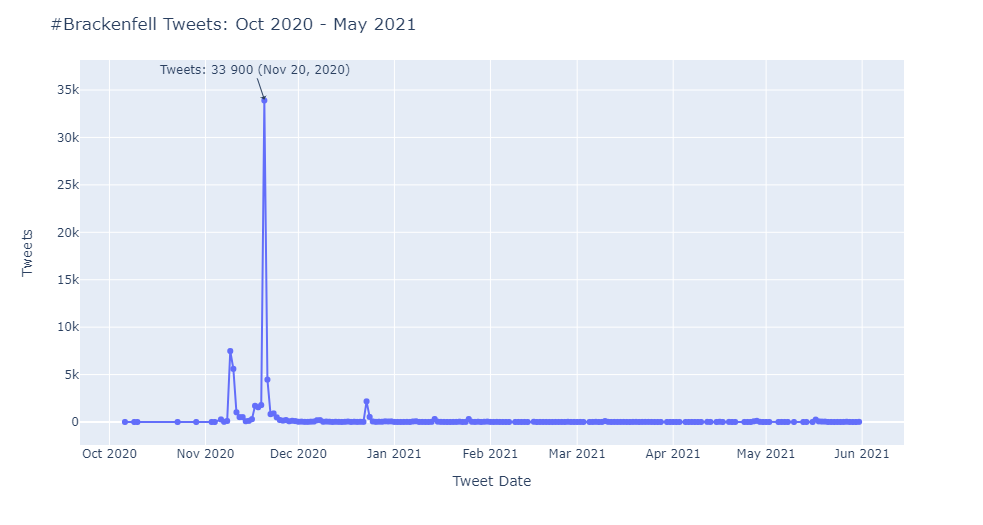

In [2]:
#
#import import_ipynb
#import os
import pandas as pd
import numpy as np
from scipy import stats
import igraph as ig
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.express as px
import random
from numpy import random as nprando
from datetime import datetime, date, time, timedelta
from IPython.display import Image, SVG, display

######################################################################################### 

##SETUP##
sns.set()
nprando.seed(111)
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams.update({'figure.figsize': (12, 8)})
pd.set_option("display.max_columns",None)

##VARIABLES##
e_tweet = "Brackenfell_2021-06-07.csv"
e_node = "brackenfell_nodes_1.csv"
e_edge = "brackenfell_edges_1.csv"

######################################################################################### 
#%matplotlib inline
df_Tweet = pd.read_csv(e_tweet, usecols=['tweet_id', 'date'], dtype={'userid': str})
df_Tweet['created'] = list(map(lambda x:datetime.strptime(x, "%Y-%m-%dT%H:%M:%S.%fZ").strftime('%Y-%m-%d'), df_Tweet['date']))
df_Tweet = df_Tweet.loc[df_Tweet['created']>= '2020-09-30']
df_Tweet['no_tweets']=df_Tweet.groupby(['created'])['created'].transform('count')
df_Tweet.drop(["tweet_id", "date"], axis=1, inplace=True)
df_Tweet.drop_duplicates(subset="created", keep='first',inplace=True)
df_Tweet = df_Tweet.sort_values(by='created')
#df_Tweet

print("\n" + "--------" + "\n" + '\033[1m' + 'Number of Daily Tweets in #Brackenfell Discourse:' + '\033[0m' + "\n")


#plt.rcParams["figure.figsize"]=[10,5]
#plt.rcParams["figure.autolayout"] =True
#fig = px.line(df_Tweet, x='created',y='no_tweets', markers=True)
#fig.update_layout(xaxis_title= 'Tweet Date', yaxis_title= 'Tweets',  title = '#Brackenfell Tweets: Oct 2020 - May 2021')
#fig.add_annotation(x='2020-11-20', y=34000, text="Tweets: 33 900 (Nov 20, 2020)", showarrow=True, arrowhead=1)
#plt.savefig("brackenfell_tweets.png")
#fig.show()

Image(filename="brackenfell_tweets_1.png",  width = "650")

#### Data Transformation




Though the extracted dataset consists of all tweets, retweets and replies to tweets related to this topic, this analysis is purely focused on direct engagements and interactions (tweets and tweet replies) between users. To construct this type of network, I only include data where a user tweets a reply (sender) to a user whose tweet was replied to (receiver).

To ensure that the transformed data still reflects the full discourse and no significant information is lost as a result of the conversion from full network to reply network, aggregate statistics that track tweet and retweet data are derived from the extracted dataset. In this way, the properties of the #Brackenfell full network are still described in the the #Brackenfell reply network. See below for a list of derived variables before transformation. 

- **Derived node variables**:
   
    >- *#tweeted* -> A measure of the total number of tweets by a user in the #Brackenfell network.
   
    >- *#retweeted* -> A measure of the total number of tweets by a user that are retweeted by other users in the #Brackenfell network.
   
    >- *#liked* -> A measure of the total number of tweets by a user that are liked by other users in the #Brackenfell network. 


- **Derived edge variables**

    >- *weight* -> This captures the total number of replies from a sender to a receiver in the #Brackenfell network. For example, replying to a user only once gives a weight = 1, but replying to a user's tweets multiple times gives a weight = number of replies to that user.

Once variables are derived, the extracted dataset is converted to a directed network, which I call the #Brackenfell Full Network.

- **#Brackenfell Full Network**

    The #Brackenfell full network consists of 68746 tweets (incl. retweets, and replies to tweets) with 21796 active users behind those tweets.

    >- Number of users: 21796

    >- Number of tweets: 68746
    
After dropping all tweets and retweets that do not have a reply, the #Brackenfell Full Network is then converted to the #Brackenfell Reply Network.

- **#Brackenfell Reply Network**

    The #Brackenfell reply network includes data on users replying to tweets and users whose tweets are being replied to. This is a weighted network where weights measure the frequency of interaction, i.e. the number of times a user replies to the same users tweets.

    >- Number of users: 2369

    >- Number of replies: 3025
    

Next, I exclude all disconnected components and focus my analysis on the #Brackenfell Reply Network - Largest Connected Component. This sub-network is found by extracting the component with the largest number of connected nodes in the network. To explain, a connected component is a network or sub-network where every node is atleast connected to one other node, i.e. there must exist a path such that any two nodes can be connected starting from point *A* to point *B*. 

- **#Brackenfell Reply Network - Largest Connected Component**

    The #Brackenfell reply network has 356 connected components. In this network, the largest connected component has 1578 nodes and 2116 edges, and the second largest connected component has 26 nodes and 28 edges. 

    >- Number of users: 1578

    >- Number of replies: 2376
   


#### Method


Using pythons iGraph library, I describe the #Brackenfell Reply Network - Largest Connected Component in terms of its **centrality** and **connectivity and cohesion** properties.

In [3]:
#
#LOAD NODE DATA##
df_node_1 = pd.read_csv(e_node, sep=";", dtype={'id': str})
df_node_1 = df_node_1.rename(columns={"user_followers_count": "followers", 'user_following_count':"following","user_tweet_count":"tweets","user_listed_count":"listed","no_#tweeted":"#tweeted","no_#retweeted":"#retweeted","no_#liked":"#liked"})
#print("\n" + '\033[1m' + 'Nodelist Description:' + '\033[0m' + "\n")
#print(df_node_1.info())
#print("\n" + "--------" + "\n" + '\033[1m' + 'Nodelist Summary Statistics:' + '\033[0m' + "\n")
#print(df_node_1.describe())

##LOAD EDGE DATA##
df_edge_1 = pd.read_csv(e_edge, sep=";", usecols=['source', 'target', 'weight'], dtype={'source': str, 'target': str, 'weight':int})
#print("\n" + '\033[1m' + 'Edgelist Description:' + '\033[0m' + "\n")
#print(df_edge_1.info())
#print("\n" + "--------" + "\n" + '\033[1m' + 'Edgelist Summary Statistics:' + '\033[0m' + "\n")
#print(df_edge_1.describe())
#print(df_edge_1['weight'].sum())

#
# CONVERT TO DIRECTED IGRAPH
G_ig=ig.Graph.DictList(df_node_1.to_dict('records'), df_edge_1.to_dict('records'), directed=True, vertex_name_attr='id', edge_foreign_keys=('source', 'target'))
#print(ig.summary(G_ig))
print("\n" + "--------" + "\n" + '\033[1m' + 'Directed Network:' + '\033[0m' + "\n")
print(ig.summary(G_ig))


--------
Directed Network:

IGRAPH DNW- 1578 2116 -- 
+ attr: #liked (v), #retweeted (v), #tweeted (v), date_tweet (v), datetime_tweet (v), followers (v), following (v), id (v), label (v), listed (v), month_tweet (v), name (v), node_type (v), tweets (v), source (e), target (e), weight (e)
None


-------------------------------------------------------------------------------
#### 1. CENTRALITY


#### 1.1. Node Centrality


To identify key or "important" node's, I determine the centrality of a node relative to other nodes in a network.


In [4]:
#
#DESCRIPTIVE ANALYSIS##
#Node Centrality Measures

d_lst = G_ig.strength(weights='weight',mode='all')
id_lst = G_ig.strength(weights='weight',mode='in')
od_lst = G_ig.strength(weights='weight',mode='out')
cl_lst = G_ig.closeness(weights='weight',mode='all')
bw_lst = G_ig.betweenness(weights='weight',directed=True)
pg_lst = G_ig.pagerank(weights='weight',directed=True)
ec_lst = G_ig.eccentricity(mode='all')

G_ig.vs['degree'] = d_lst
G_ig.vs['indegree'] = id_lst
G_ig.vs['outdegree'] = od_lst
G_ig.vs['closeness'] = cl_lst
G_ig.vs['betweenness'] = bw_lst
G_ig.vs['pagerank'] = pg_lst
G_ig.vs['eccentricity'] = ec_lst

df_attr = G_ig.get_vertex_dataframe()
print("\n" + "--------" + "\n" + '\033[1m' + 'Node Centrality: Summary Statistics' + '\033[0m' + "\n")
print("------------------------"+ "\n" )
print(df_attr.loc[:,['indegree', 'outdegree', 'closeness', 'betweenness', 'pagerank', 'eccentricity']].describe())



--------
Node Centrality: Summary Statistics

------------------------

          indegree    outdegree    closeness  betweenness     pagerank  \
count  1578.000000  1578.000000  1578.000000  1578.000000  1578.000000   
mean      1.505703     1.505703     0.161173     8.799676     0.000634   
std       5.555647     2.630060     0.025760    56.537619     0.002159   
min       0.000000     0.000000     0.080959     0.000000     0.000223   
25%       0.000000     1.000000     0.142583     0.000000     0.000223   
50%       1.000000     1.000000     0.162243     0.000000     0.000245   
75%       1.000000     2.000000     0.184731     0.000000     0.000455   
max     147.000000    50.000000     0.240360  1019.000000     0.060501   

       eccentricity  
count   1578.000000  
mean      11.406844  
std        1.170014  
min        9.000000  
25%       11.000000  
50%       11.000000  
75%       12.000000  
max       16.000000  



--------
Maximum Indegree:

EFFSouthAfrica


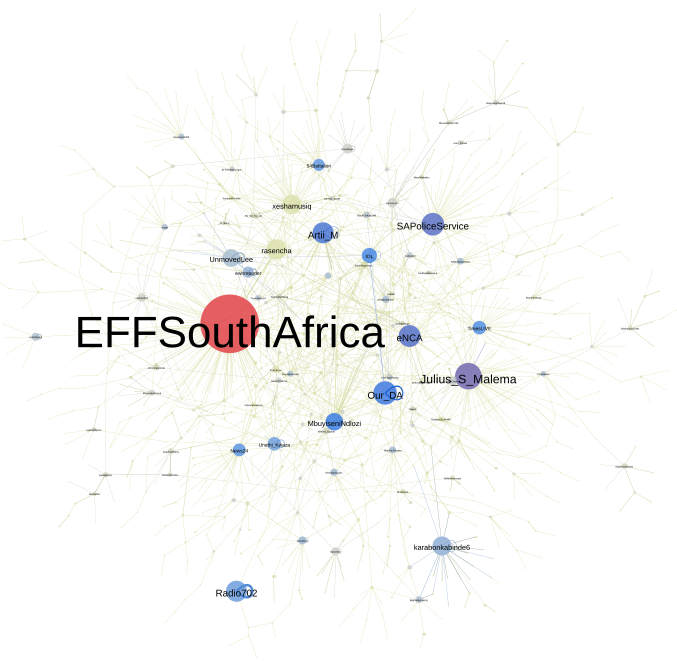

In [5]:
#

#Indegree
df_ind=df_attr.loc[df_attr['indegree']==df_attr['indegree'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum Indegree:' + '\033[0m' + "\n")
#print(df_ind.loc[:,['label']].reset_index(drop=True))
print(list(df_ind['label'])[0])
display(SVG(filename="brackenfell_feat_ind_1.svg"))


--------
Maximum Outdegree:

rasencha


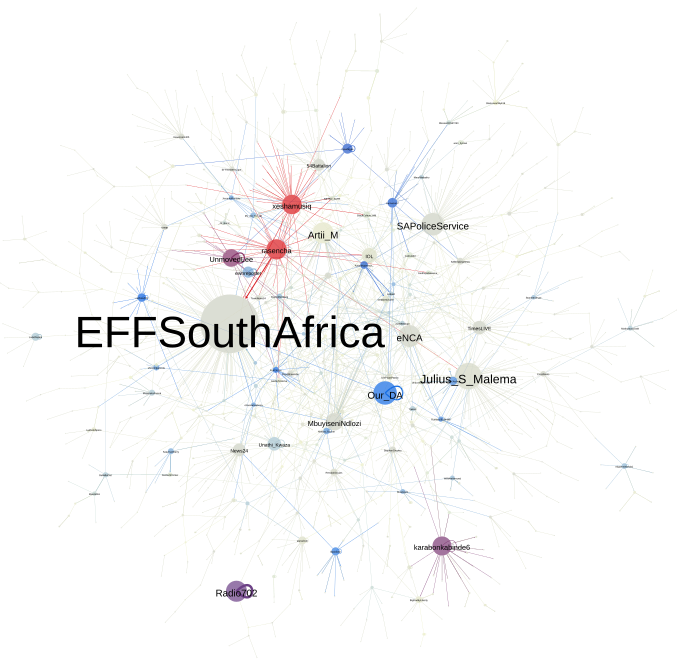

In [6]:
#
df_out=df_attr.loc[df_attr['outdegree']==df_attr['outdegree'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum Outdegree:' + '\033[0m' + "\n")
#print(df_out.loc[:,['label']].reset_index(drop=True))
print(list(df_out['label'])[0])
display(SVG(filename="brackenfell_feat_out_1.svg"))


--------
Maximum Closeness:

EFFSouthAfrica


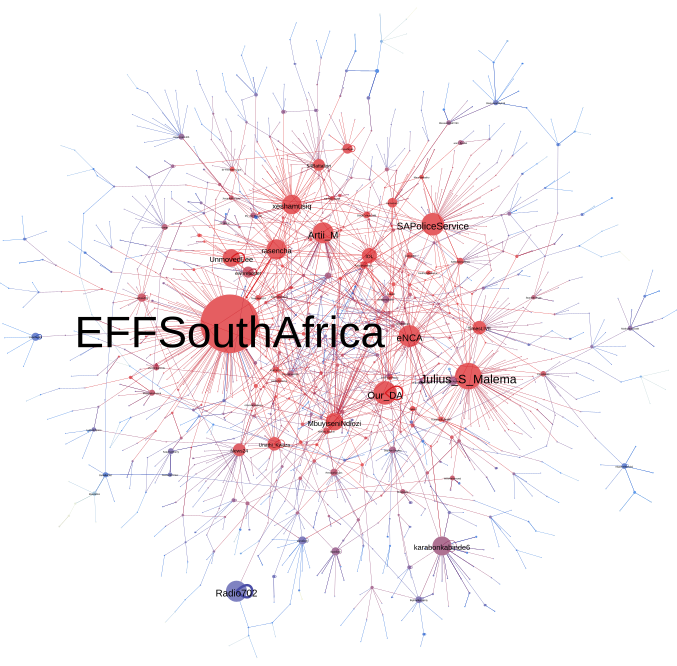

In [7]:
#
df_cls=df_attr.loc[df_attr['closeness']==df_attr['closeness'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum Closeness:' + '\033[0m' + "\n")
#print(df_cls.loc[:,['label']].reset_index(drop=True))
print(list(df_cls['label'])[0])
display(SVG(filename="brackenfell_feat_cls_1.svg"))


--------
Maximum Betweeness:

JoelMMalope


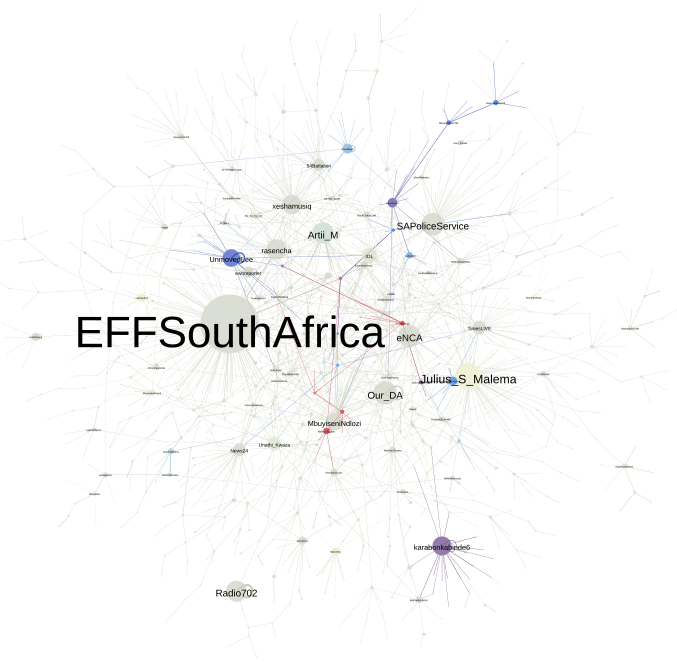

In [8]:
#
df_btw=df_attr.loc[df_attr['betweenness']==df_attr['betweenness'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum Betweeness:' + '\033[0m' + "\n")
#print(df_btw.loc[:,['label']].reset_index(drop=True))
print(list(df_btw['label'])[0])
display(SVG(filename="brackenfell_feat_btw_1.svg"))


--------
Maximum PageRank:

Our_DA


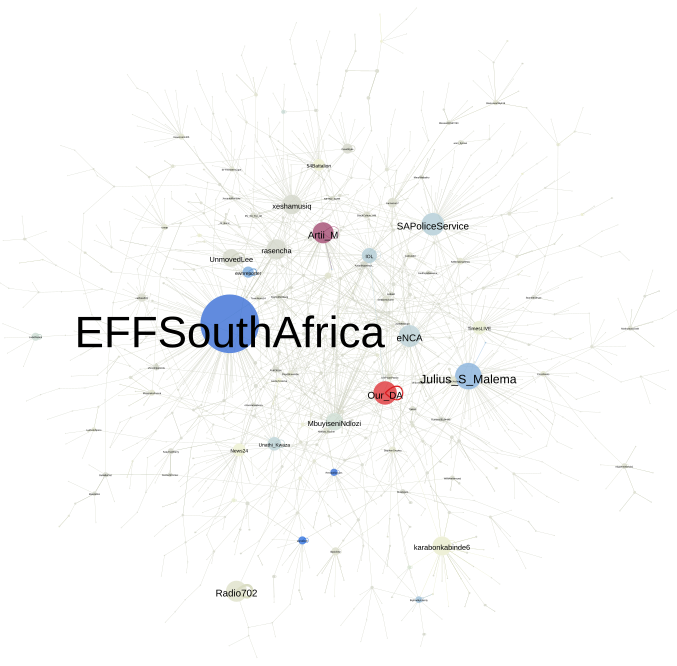

In [9]:
#
df_pgr=df_attr.loc[df_attr['pagerank']==df_attr['pagerank'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum PageRank:' + '\033[0m' + "\n")
#print(df_pgr.loc[:,['label']].reset_index(drop=True))
print(list(df_pgr['label'])[0])
display(SVG(filename="brackenfell_feat_pgr_1.svg"))


--------
Minimum Eccentricity:

              label
0    EFFSouthAfrica
1   DiePlaasPatriot
2     The_Reality_1
3   Julius_S_Malema
4           Artii_M
5   Dennistalksfact
6      PearcesVoice
7               IOL
8    Matewis_Dyches
9    ZakirahTriveni
10   Rosemary_Hardy
11         rasencha
12          gee_juz
13  mfanafuthishaba


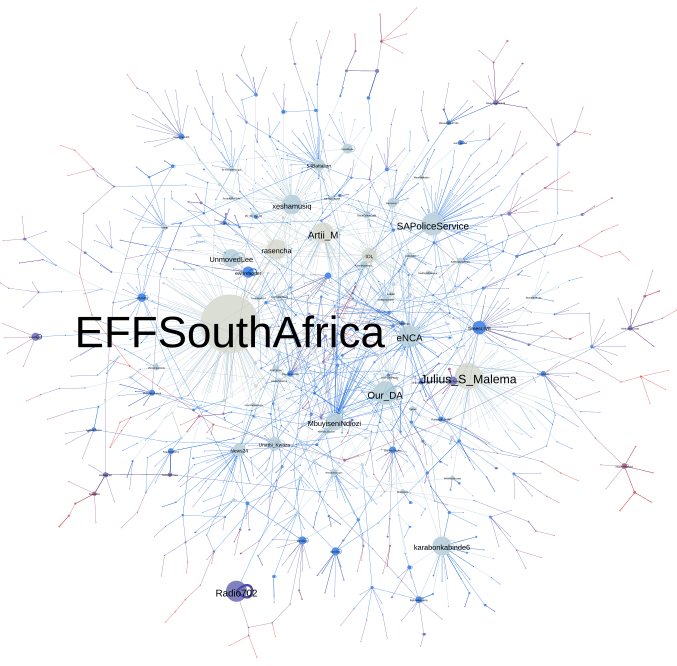

In [10]:
#
df_ecc=df_attr.loc[df_attr['eccentricity']==df_attr['eccentricity'].min()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Minimum Eccentricity:' + '\033[0m' + "\n")
print(df_ecc.loc[:,['label']].reset_index(drop=True))
#print(list(df_ecc['label'])[0])
display(SVG(filename="brackenfell_feat_ecc_1.svg"))

#### 1.2. Network Centrality




To determine relationships between nodes and their position in the network, I measure a node's ties relative to the ties present in the network and the distribution of ties throughout the network.



--------
Network Centrality: Summary Statitics
------------------------


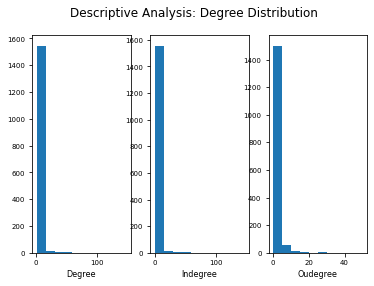

In [11]:
#
# Plot degree distribution
print("\n" + "--------" + "\n" + '\033[1m' + 'Network Centrality: Summary Statitics' + '\033[0m')
print("------------------------")
#print("\n" + "--------" + "\n" + '\033[1m' + 'Degree Distribution:' + '\033[0m')
def plot_degree_hist(G):
    deg_lst = [G.strength(n,weights='weight',mode='all') for n in G.vs()]
    indeg_lst = [G.strength(n,weights='weight',mode='in') for n in G.vs()]
    outdeg_lst = [G.strength(n,weights='weight',mode='out') for n in G.vs()]

    plt.rcParams["figure.figsize"]=[10,5]
    #plt.rcParams["figure.autolayout"] =True

    plt.subplot(1,3,1)
    plt.hist(deg_lst)
    plt.xlabel('Degree', fontsize=8)
    plt.xticks(fontsize=7)
    plt.yticks(fontsize=7)
    plt.subplot(1,3,2)
    plt.hist(indeg_lst)
    plt.xticks(fontsize=7)
    plt.yticks(fontsize=7)
    plt.xlabel('Indegree', fontsize=8)
    plt.subplot(1,3,3)
    plt.xticks(fontsize=7)
    plt.yticks(fontsize=7)
    plt.hist(outdeg_lst)
    plt.xlabel('Oudegree', fontsize=8)


    plt.suptitle('Descriptive Analysis: Degree Distribution')
    #plt.savefig("{}".format(gpath) + x + "_degree_hist_wr.png")
    plt.show()

plot_degree_hist(G_ig)

In [12]:
#Find network degree
print("\n" + "--------" + "\n" + '\033[1m' + 'Average Degree:' + '\033[0m')
deg_lst = [G_ig.strength(n,weights='weight',mode='all') for n in G_ig.vs()]
np.mean(deg_lst)



--------
Average Degree:


3.011406844106464

In [13]:
#Find network density
print("\n" + "--------" + "\n" + '\033[1m' + 'Density:' + '\033[0m')
G_ig.density()


--------
Density:


0.0008503093824165985

In [14]:
#Find network path length
print("\n" + "--------" + "\n" + '\033[1m' + 'Average Path Length:' + '\033[0m')
G_ig.average_path_length(directed=True)


--------
Average Path Length:


2.9253503538226724

---------------------------------------------------------------------
#### 2. CONNECTIVITY AND COHESION 




To examine how tightly connected or clustered the network is, I examine the direction, frequency and consistency of relations between nodes and the nodes in their neighbourhood.


In [15]:
#
# Find Ego Network
# This function limits the network to a given node's neighborhood (defined n-steps away) and then runs the triad census on that neighborhood.	
ego_triad_lst=[]
ego_dyad_lst=[] 

def find_ego_triad(G, nodes, steps=2):
    #print(G.vs[0]["id"])
    for n in nodes:
        ego_lst = G.neighborhood(vertices=n, order=steps, mode='out', mindist=0)
        G_ego = G.induced_subgraph(vertices=ego_lst, implementation="auto")
        ego_triad = G_ego.triad_census()
        ego_triad_lst.append(list(ego_triad))

    return ego_triad_lst

ego_step_3 = find_ego_triad(G_ig, G_ig.vs, steps=3)
triads = ["003", "012", "102", "021D", "021U", "021C", "111D", "111U", "030T", "030C", "201", "120D", "120U", "120C", "210C", "300"]

for i in range(0,len(triads)):
    G_ig.vs["triad_"+"{}".format(i)] = [ego[i] for ego in ego_step_3]
  
   
def find_ego_dyad(G, nodes, steps=2):
    #print(G.vs[0]["id"])
    for n in nodes:
        ego_lst = G.neighborhood(vertices=n, order=steps, mode='out', mindist=0)
        G_ego = G.induced_subgraph(vertices=ego_lst, implementation="auto")
        ego_dyad = G_ego.dyad_census()
        ego_dyad_lst.append(list(ego_dyad))

    return ego_dyad_lst

ego_dyad_3 = find_ego_dyad(G_ig, G_ig.vs, steps=3)
#G_ig.vs["003"] = [d["003"] for i in ego_step_3 for d in i.items()]
dyads = ["mutual", "asymmetric", "null"]

for i in range(0,len(dyads)):
    G_ig.vs[dyads[i]] = [ego[i] for ego in ego_dyad_3]

df_attr = G_ig.get_vertex_dataframe()
df_attr["reciprocity"] = df_attr['triad_2']+df_attr['triad_10']+df_attr['triad_15']
df_attr["transitivity"] = df_attr['triad_8']+df_attr['triad_11']+df_attr['triad_12']+df_attr['triad_15']
df_attr["hierarchy"] = df_attr['triad_3']+df_attr['triad_4']+df_attr['triad_8']+df_attr['triad_11']+df_attr['triad_12']
df_attr["mutual"] = df_attr['mutual']
df_attr["asymmetric"] = df_attr['asymmetric']
df_attr["null"] = df_attr['null']
    
print("\n" + "--------" + "\n" + '\033[1m' + 'Connectivity and Cohesion: Summary Statistics' + '\033[0m')
print("------------------------"+ "\n" )
print(df_attr.loc[:,["reciprocity","transitivity","hierarchy"]].describe())

df_attr.to_csv("brackenfell_features_1.csv", sep=";",encoding='utf-8',  index=False)



--------
Connectivity and Cohesion: Summary Statistics
------------------------

       reciprocity  transitivity    hierarchy
count  1578.000000   1578.000000  1578.000000
mean      9.060837      0.050697     3.557034
std      41.176039      0.366602    30.735183
min       0.000000      0.000000     0.000000
25%       0.000000      0.000000     0.000000
50%       0.000000      0.000000     0.000000
75%       0.000000      0.000000     1.000000
max     597.000000     10.000000   940.000000



--------
Maximum Reciprocity:

rasencha


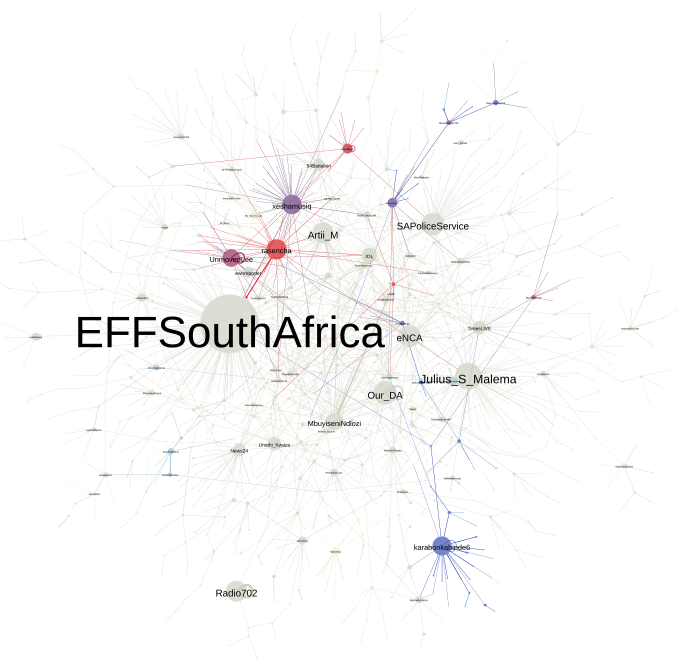

In [16]:
#
#print("\n" + "--------" + "\n" + '\033[1m' + 'Connectivity and Cohesion: Top Users' + '\033[0m' + "\n")
#print("\n" + "------------------------")
df_rcp=df_attr.loc[df_attr['reciprocity']==df_attr['reciprocity'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum Reciprocity:' + '\033[0m' + "\n")
#print(df_rcp.loc[:,['label']].reset_index(drop=True))
print(list(df_rcp['label'])[0])

#df_mtl=df_attr.loc[df_attr['mutual']==df_attr['mutual'].max()]
#print("\n" + "--------" + "\n" + '\033[1m' + 'Mutual:' + '\033[0m' + "\n")
#print(df_mtl.loc[:,['id','label']].reset_index(drop=True))
display(SVG(filename="brackenfell_feat_rcp_1.svg"))


--------
Maximum Transitivity:

xeshamusiq


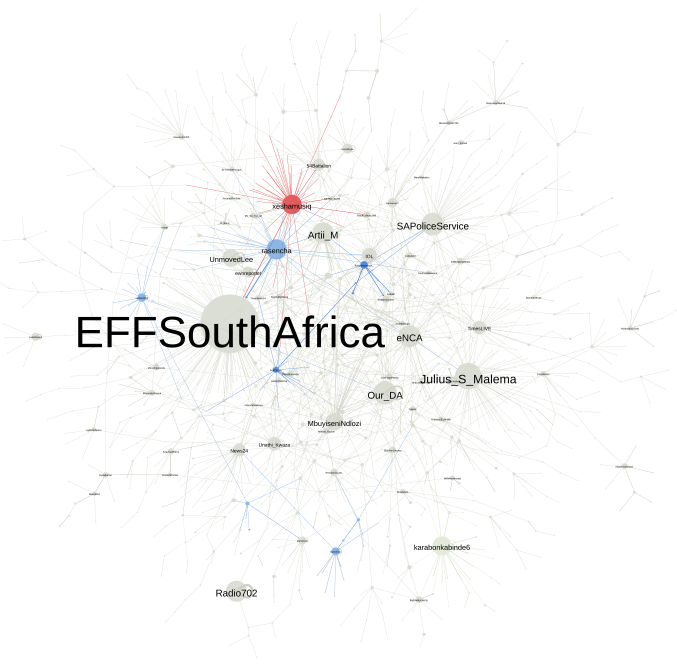

In [17]:
#
df_trs=df_attr.loc[df_attr['transitivity']==df_attr['transitivity'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum Transitivity:' + '\033[0m' + "\n")
#print(df_trs.loc[:,['label']].reset_index(drop=True))
print(list(df_trs['label'])[0])
display(SVG(filename="brackenfell_feat_trs_1.svg"))


--------
Maximum Hierarchy:

xeshamusiq


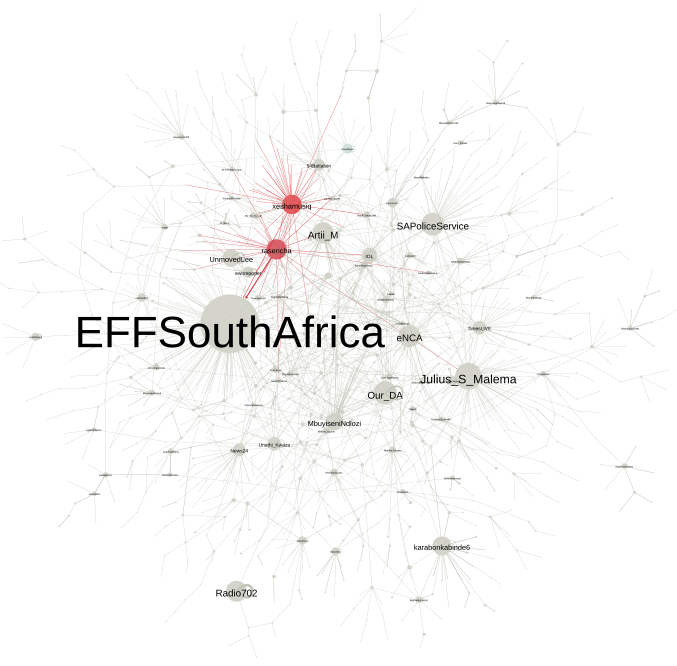

In [18]:
#
df_hrc=df_attr.loc[df_attr['hierarchy']==df_attr['hierarchy'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum Hierarchy:' + '\033[0m' + "\n")
#print(df_hrc.loc[:,['label']].reset_index(drop=True))
print(list(df_hrc['label'])[0])
display(SVG(filename="brackenfell_feat_hrc_1.svg"))

In [19]:
#Find network clustering
print("\n" + "--------" + "\n" + '\033[1m' + 'Average Clustering Coefficient:' + '\033[0m')
G_ig.transitivity_avglocal_undirected()


--------
Average Clustering Coefficient:


0.04255027112376041

-----------------------------------------------------------------------
#### 3. EVALUATION




To determine if the current network exhibits small world properties, I simulate multiple random networks and compare the average distances and clustering features of either network.


In [20]:
data = list()
avg_clust = list()
avg_path = list()
for i in range(1,101):
    G_rando = ig.Graph.Erdos_Renyi(n=1578, m=2116,  directed=True, loops=True)
    
    path = G_rando.average_path_length(directed=True)
    clust = G_rando.transitivity_avglocal_undirected()
    
    avg_path.append(path)
    avg_clust.append(clust)
    
#print(len([i for i in G_rando.es]))

In [21]:
print("\n" + "------------------------" + "\n" + '\033[1m' + 'Random Network:' + '\033[0m')
print("------------------------")

print("\n" + "--------" + "\n" + '\033[1m' + 'Average Path Length:' + '\033[0m')
sum(avg_path)/len(avg_path)



------------------------
Random Network:
------------------------

--------
Average Path Length:


16.67812299194082

In [22]:
print("\n" + "--------" + "\n" + '\033[1m' + 'Average Clustering Coefficient:' + '\033[0m')
sum(avg_clust)/len(avg_clust)


--------
Average Clustering Coefficient:


0.001656284988354186

-----------------------------------
#### 4. SUMMARY



In this section, I perform descriptive analysis on the #Brackenfell twitter reply network to determine certain node features and network properties that identify significant players in the discourse. I summarise a few findings below.

In addition to skewed or unequal degree distributions, which indicates a tendency of preferential attachment toward popular users, this network exhibits high clustering (26.1x higher) and small average distances (5.8x smaller) than randomly simulated networks of the same size. Consistent with the impression of small worlds. 

Twitter accounts found to rank highly on certain network measures are listed below:

- **EFFSouthAfrica** (Indegree, Closeness) 


- **Our_DA** (PageRank) 


- **JoelMMalope** (Betweenness)


- **rasencha** (Outdegree, Reciprocity)


- **xeshamusiq** (Transitivity, Hierarchy)


Other than the usual suspects, the user accounts **rasencha** and **xeshamusiq** are notable in measures of *reciprocity*, *transitivity* and *hierarchy*. After examining the data further, it appears that in an attempt to promote their music, the user account **xeshamusiq** was targeting and trolling prominent users within the discourse by actively replying to their tweets asking them to retweet and like his pinned tweet.


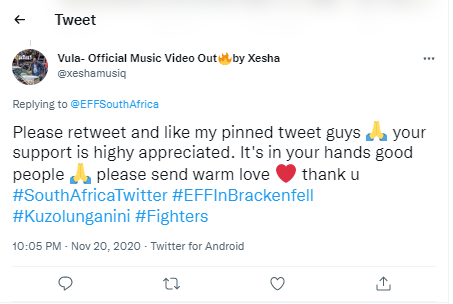

In [23]:
Image(filename="Brackenfell_Xeshamusiq.png",  width = "350")

The twitter account **rasencha**, on the other hand, appears to actively be involved in the discourse and has formed a neighbourhood that includes other highly responsive users. Currently the user behind this account has been suspended off twitter, likely due to the racially discriminatory undertones of their tweets. 

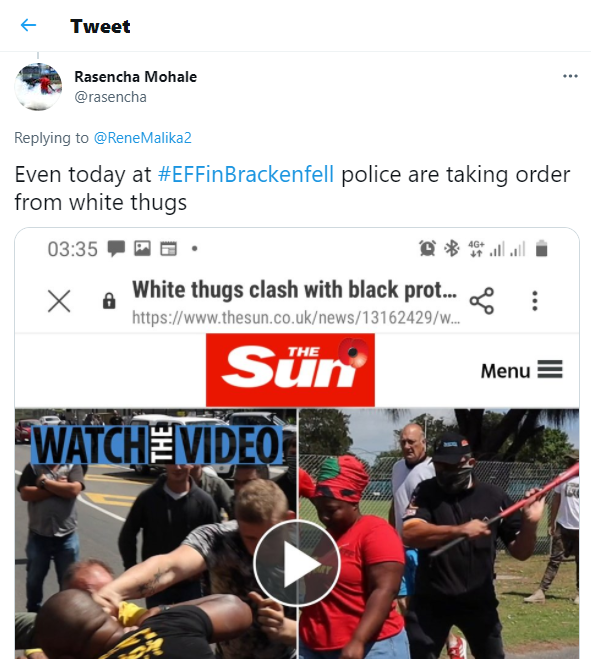

In [24]:
Image(filename="Brackenfell_Rasencha_1.png",  width = "350")

In the next section, I explore the network further by using community detection methods to identify groups (communities) of users that are densely connected and have high levels of interaction within the discourse.